In [1]:
from ripser import ripser
from persim import plot_diagrams
from numpy import sin,cos, dot
import numpy as np
from numpy import pi,cos,sin
import matplotlib.pyplot as plt
import random


In [2]:
def graph_continuous(image_function, x, y, x_random = True, n_samples= 100000, y_random = True):
    
    if x_random == True:
        X = list(2 * x * np.random.random(n_samples) - x) 
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)      

    if x_random == False:
        X = np.linspace(-x,x,n_samples)
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)   

    x_points = []
    y_points = []
    colors = []
    for i in range(n_samples):
        color = image_function(X[i],Y[i]) 
        colors.append(color)
        x_points.append(X[i])
        y_points.append(Y[i])

        
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors, s = .1)
    plt.show()
    
    
def view_window_continuous(image_function, num_pixels, window_size):
    
    pixels = get_pixels(num_pixels, window_size)
            
    x_points = []
    y_points = []
    colors = []
    for i in range(len(pixels)):
        color = image_function(pixels[i][0],pixels[i][1]) 
        colors.append(color)
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors)
    plt.show()

In [3]:
def get_pixels(num_pixels, window_size):
    sample = list(np.linspace(-window_size/2, window_size/2, num_pixels))
    pixels = []
    for i in range(len(sample)):
        for j in range(len(sample)):
            pixels.append((sample[i],sample[j]))     
    return pixels


def get_colors(pixels, image_function):
    colors = []
    for pixel in pixels:
        colors.append(image_function(pixel[0],pixel[1]))
    return colors  

def translation(a,b):
    def t_ab(x,y): 
        return x+a, y+b
    return t_ab

def rotation(theta):
    def r_theta(x,y):
        return x * cos(theta) - y * sin(theta), x * sin(theta) + y * cos(theta)
    return r_theta

def isom(a,b,theta):
    def iso(x,y):
        r = rotation(theta)
        t = translation(a,b)
        return t(r(x,y)[0], r(x,y)[1])
    return iso

def generate_isom(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(2 * pi * np.random.random(n_isos)) # sampling from (0, 2pi)

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

def new_colors(pixels, iso_inv, image_function):
    pixels_inv = []
    for pixel in pixels: 
        pixels_inv.append(iso_inv(pixel[0], pixel[1]))
    new_colors = get_colors(pixels_inv, image_function)
    return new_colors

def matrix_of_images(pixels, isos_inv, image_function):
    vectors = []
    for i in isos_inv:
        vectors.append([new_colors(pixels, i, image_function)])
    M = np.concatenate(vectors, axis=0 )
    return M

def p_hom(M, maxdim, coeff):
    output = ripser(M, maxdim = maxdim, coeff = coeff)
    return output
    
def persistent_H1_intervals(output):
    H1 = output['dgms'][1].tolist() # all intervals in H1
    d = []
    for pair in H1: 
        d.append(pair[1] - pair[0]) # finding lengths of intervals in H1
    d.sort(reverse = True) # sorting from longest to shortest intervals
    d
    return d

def plot_dgms(output):
    dgms = output['dgms']
    fig = plt.figure(figsize = (12, 6))
    plot_diagrams(dgms)
    
def pipeline(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

In [4]:
def p2(x,y): 
    d1 = (1,0)
    d2 = (0,1)
    X = 1/(2*pi) * np.dot((x,y), d1)
    Y = 1/(2*pi) * np.dot((x,y), d2)
    return cos(2*X + Y) + sin(2*X + Y)

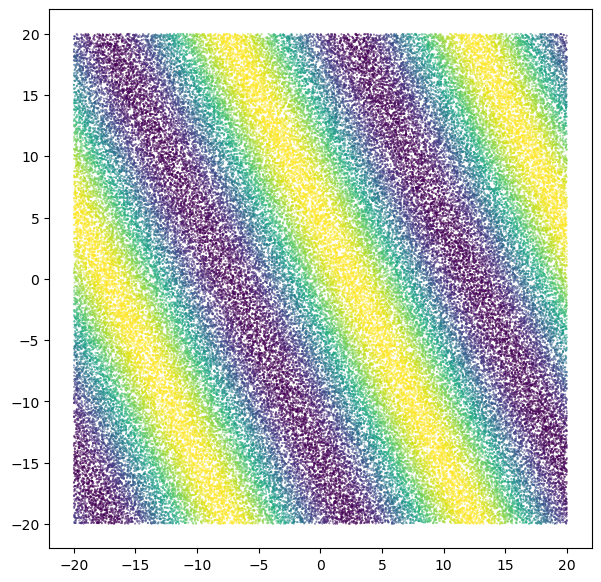

In [5]:
graph_continuous(p2, 20,20)

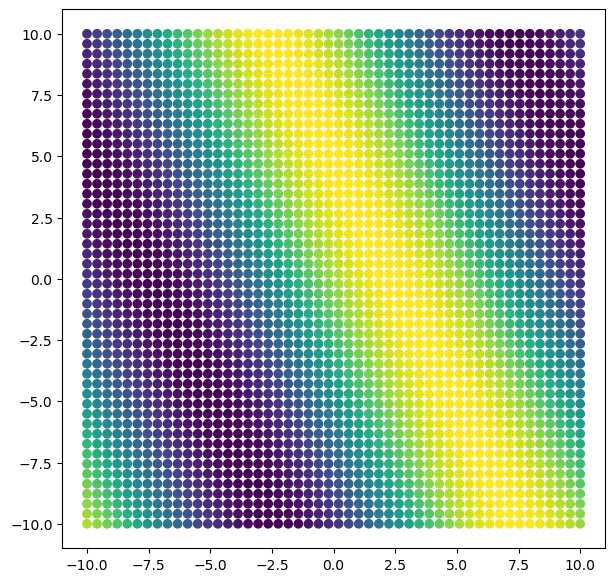

In [38]:
view_window_continuous(p2, 50, 20)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


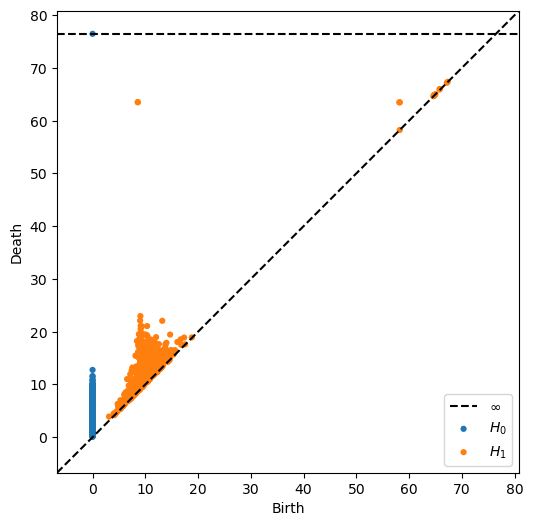

In [7]:
#Z2
output = pipeline(image_function = p2, num_pixels = 50 , window_size = 20, n_isos = 2000, x_translate= 50 , y_translate=50, maxdim=1, coeff=2)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


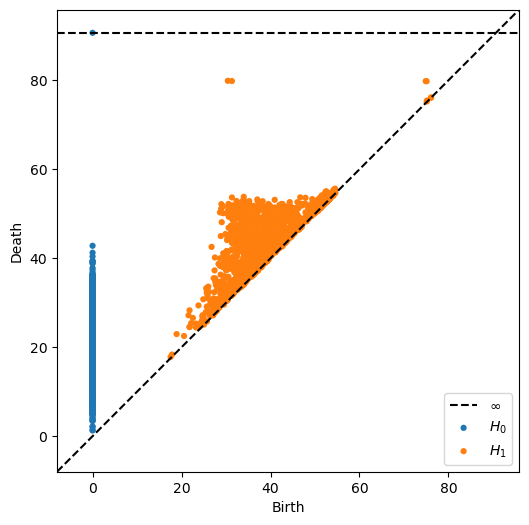

In [12]:
#Z2
output = pipeline(image_function = p2, num_pixels = 50 , window_size = 30, n_isos = 2000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


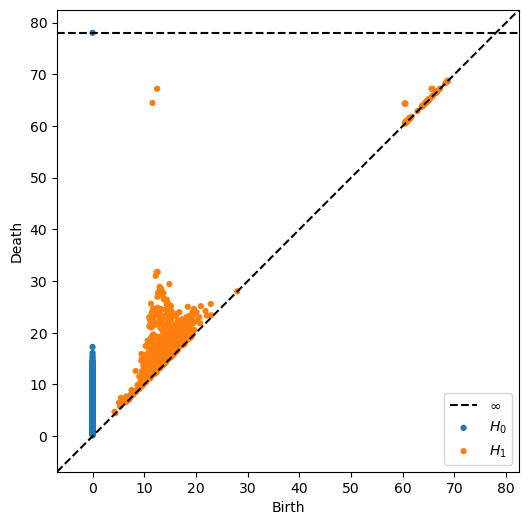

In [20]:
#Z2
output = pipeline(image_function = p2, num_pixels = 50 , window_size = 40, n_isos = 2000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

In [21]:
persistent_H1_intervals(output)

[54.71870231628418,
 52.863511085510254,
 19.36643123626709,
 19.164074897766113,
 18.77771759033203,
 15.934049606323242,
 15.349609375,
 15.246659278869629,
 15.109169960021973,
 14.789590835571289,
 14.60845947265625,
 14.581419944763184,
 14.506658554077148,
 14.421547889709473,
 14.31942081451416,
 14.245341300964355,
 13.966099739074707,
 12.951408386230469,
 12.888427734375,
 12.601336479187012,
 12.458893775939941,
 12.34591293334961,
 12.239870071411133,
 12.188721656799316,
 12.05647087097168,
 12.047175407409668,
 11.823349952697754,
 11.589700698852539,
 11.410201072692871,
 11.208984375,
 11.187663078308105,
 11.179177284240723,
 11.163875579833984,
 11.013641357421875,
 10.975608825683594,
 10.801117897033691,
 10.560813903808594,
 10.427849769592285,
 10.265701293945312,
 10.258973121643066,
 10.205724716186523,
 10.174132347106934,
 10.124574661254883,
 10.073948860168457,
 10.066947937011719,
 9.893089294433594,
 9.867040634155273,
 9.756040573120117,
 9.65323162078857

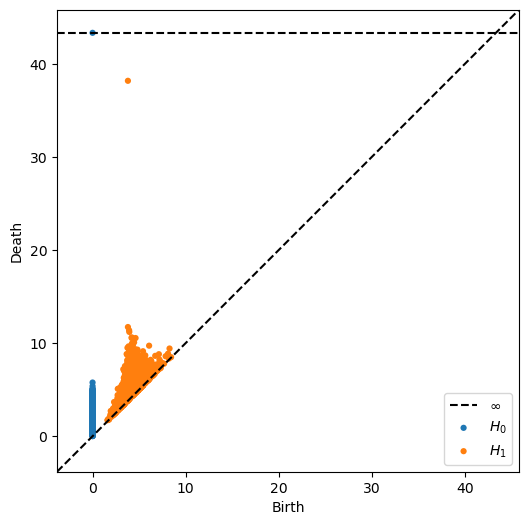

In [26]:
#Z3
output = pipeline(image_function = p2, num_pixels = 50 , window_size = 10, n_isos = 5000, x_translate= 20 , y_translate=20, maxdim=1, coeff=3)
plot_dgms(output)

**indicated that there is one class in H1 over $\mathbb{Z}_2$, but increasing window size showed there to be two... either way we want 3**

In [23]:
def p1(x,y): # wrong
    d1 = (1,-2)
    d2 = (0,1)
    X = 1/(2*pi) * np.dot((x,y), d1)
    Y = 1/(2*pi) * np.dot((x,y), d2)
    return cos(X + Y) + sin(X + Y) + sin(4 * X + Y) 

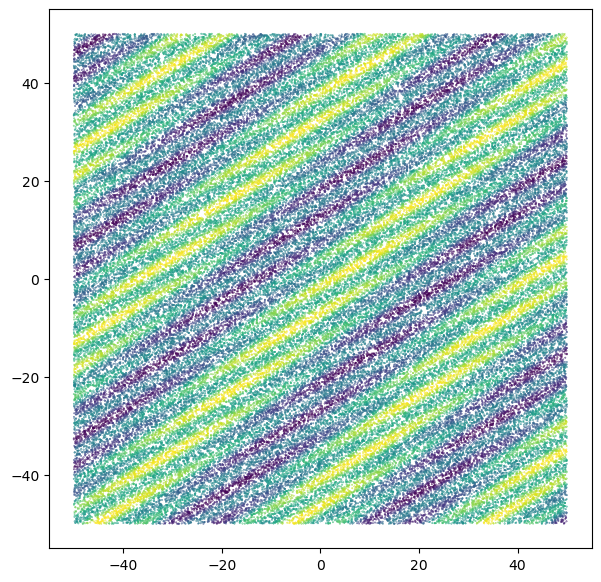

In [24]:
graph_continuous(p1, 50,50)

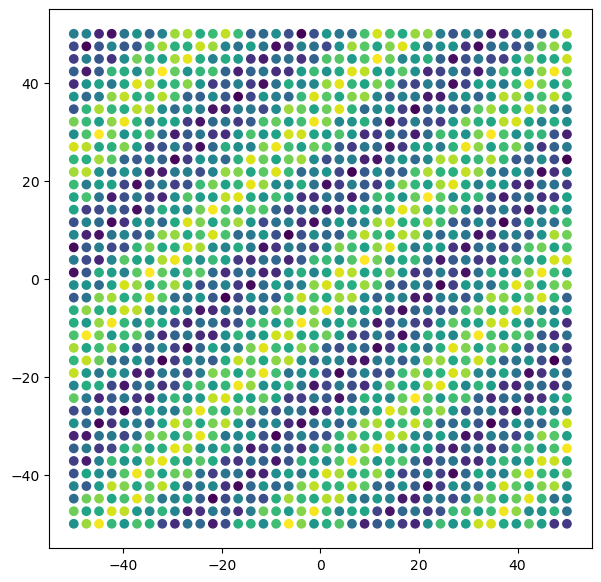

In [32]:
view_window_continuous(p1, 40, 100)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


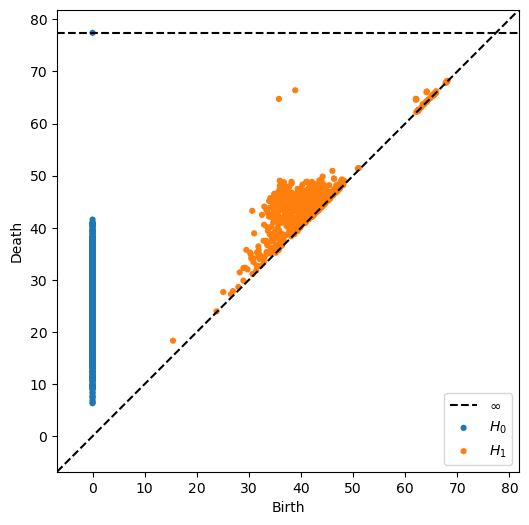

In [26]:
#Z2
output = pipeline(image_function = p1, num_pixels = 40 , window_size = 50, n_isos = 1000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

In [27]:
persistent_H1_intervals(output)

[28.9754638671875,
 27.502704620361328,
 13.1175537109375,
 12.604761123657227,
 12.3333740234375,
 12.241199493408203,
 12.121124267578125,
 12.034931182861328,
 11.652961730957031,
 11.572952270507812,
 11.4637451171875,
 11.282310485839844,
 11.270946502685547,
 11.230674743652344,
 11.113128662109375,
 11.107959747314453,
 10.773822784423828,
 10.770038604736328,
 10.648014068603516,
 10.603885650634766,
 10.51544189453125,
 10.476890563964844,
 10.462505340576172,
 10.398662567138672,
 10.313724517822266,
 10.310832977294922,
 10.231857299804688,
 10.22439956665039,
 10.161872863769531,
 10.158233642578125,
 10.08736801147461,
 10.01824951171875,
 9.998607635498047,
 9.958526611328125,
 9.951240539550781,
 9.869976043701172,
 9.81985092163086,
 9.740013122558594,
 9.699363708496094,
 9.52838134765625,
 9.522205352783203,
 9.496997833251953,
 9.286945343017578,
 9.284748077392578,
 9.234180450439453,
 9.22555923461914,
 9.169296264648438,
 9.164249420166016,
 9.1309814453125,
 9.07

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


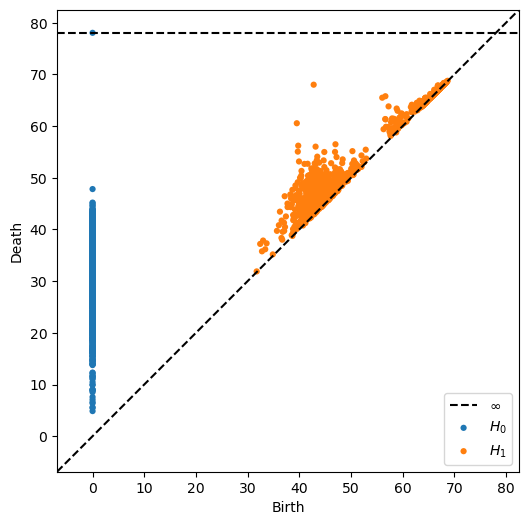

In [30]:
#Z2
output = pipeline(image_function = p1, num_pixels = 40 , window_size = 100, n_isos = 1000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

In [31]:
persistent_H1_intervals(output)

[25.231063842773438,
 21.035968780517578,
 16.420249938964844,
 15.355850219726562,
 13.214984893798828,
 12.875301361083984,
 11.684696197509766,
 11.09356689453125,
 10.902824401855469,
 10.607635498046875,
 10.147327423095703,
 10.043594360351562,
 10.003791809082031,
 9.863616943359375,
 9.8004150390625,
 9.627193450927734,
 9.496856689453125,
 9.487983703613281,
 9.467460632324219,
 9.444202423095703,
 9.441162109375,
 9.259601593017578,
 9.252742767333984,
 9.11795425415039,
 9.080009460449219,
 9.02634048461914,
 9.003475189208984,
 8.788612365722656,
 8.709793090820312,
 8.700904846191406,
 8.650794982910156,
 8.596527099609375,
 8.570579528808594,
 8.509754180908203,
 8.484718322753906,
 8.396671295166016,
 8.312686920166016,
 8.233718872070312,
 8.091621398925781,
 8.083698272705078,
 7.983036041259766,
 7.951576232910156,
 7.949867248535156,
 7.940883636474609,
 7.830150604248047,
 7.756282806396484,
 7.686069488525391,
 7.647087097167969,
 7.63031005859375,
 7.6020889282226

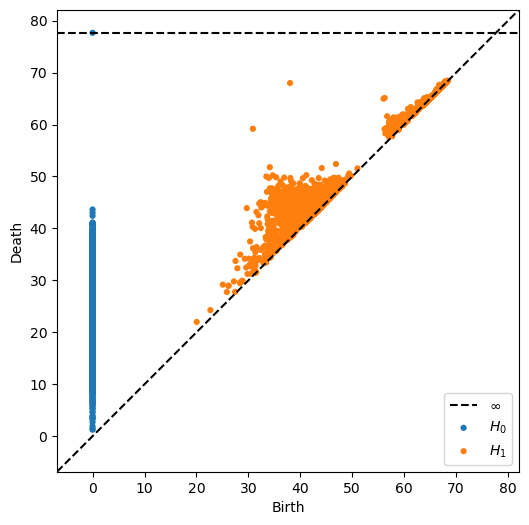

In [33]:
#Z2
output = pipeline(image_function = p1, num_pixels = 40 , window_size = 100, n_isos = 2000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


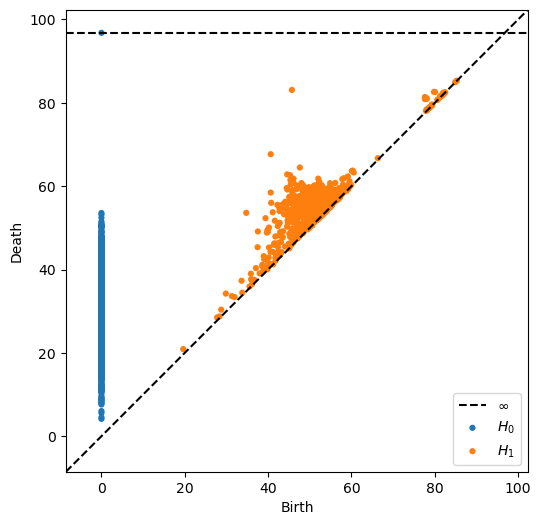

In [28]:
#Z3
output = pipeline(image_function = p1, num_pixels = 50 , window_size = 50, n_isos = 1000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

In [29]:
persistent_H1_intervals(output)

[37.38134002685547,
 27.053634643554688,
 18.850841522216797,
 18.245189666748047,
 17.845993041992188,
 17.35871124267578,
 16.8621826171875,
 16.11355972290039,
 15.704879760742188,
 15.26025390625,
 15.082416534423828,
 14.9993896484375,
 14.7015380859375,
 14.577556610107422,
 13.299880981445312,
 13.274517059326172,
 13.23129653930664,
 13.01806640625,
 12.94631576538086,
 12.755672454833984,
 12.716163635253906,
 12.663467407226562,
 12.63580322265625,
 12.47940444946289,
 12.378864288330078,
 12.271171569824219,
 12.26785659790039,
 12.267135620117188,
 12.171634674072266,
 12.138236999511719,
 12.08517074584961,
 12.07461166381836,
 12.054672241210938,
 12.040966033935547,
 12.012340545654297,
 12.002525329589844,
 11.775161743164062,
 11.683197021484375,
 11.59109878540039,
 11.528247833251953,
 11.491104125976562,
 11.418865203857422,
 11.378582000732422,
 11.35860824584961,
 11.286216735839844,
 11.269641876220703,
 11.210517883300781,
 11.170860290527344,
 11.08963394165039

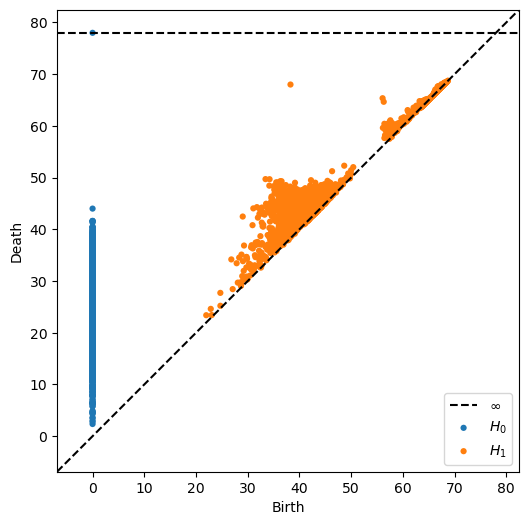

In [34]:
#Z3
output = pipeline(image_function = p1, num_pixels = 40 , window_size = 100, n_isos = 2000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

**seem to be getting 2 for $\mathbb{Z}_2$ and 1 for $\mathbb{Z}_3$ again??**

# C3

In [4]:
def p3(x,y):
    X = 1/(2 * pi) * (x + y / (3**(1/2)))
    Y = 1/(2 * pi) * 2 * y / (3**(1/2))
    C = cos(X + Y) + cos(X - 2 * Y) + cos(-2 * X + Y)
    S = sin(X + Y) +sin(X - 2*Y) +sin(-2 * X + Y)
    return C + S

In [5]:
def get_pixels(num_pixels, window_size):
    sample = list(np.linspace(-window_size/2, window_size/2, num_pixels))
    pixels = []
    for i in range(len(sample)):
        for j in range(len(sample)):
            pixels.append((sample[i],sample[j]))     
    return pixels


def get_colors(pixels, image_function):
    colors = []
    for pixel in pixels:
        colors.append(image_function(pixel[0],pixel[1]))
    return colors 

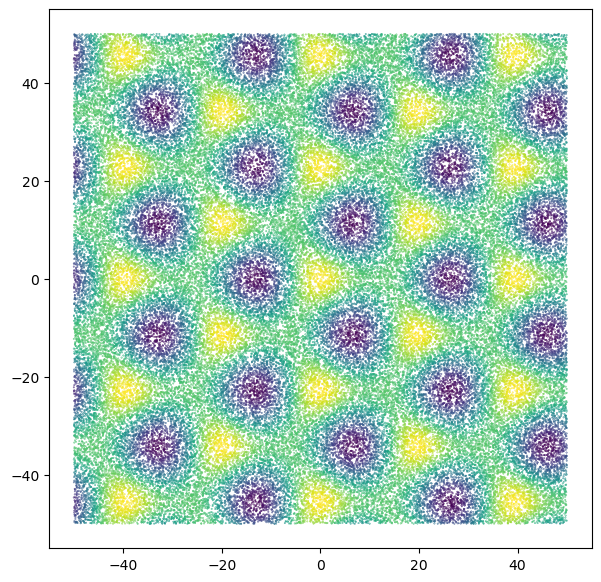

In [6]:
graph_continuous(p3, 50,50)

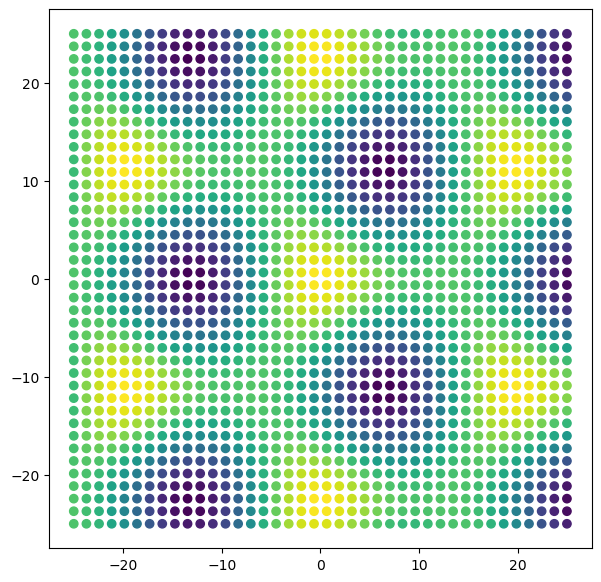

In [7]:
view_window_continuous(p3, 40, 50)

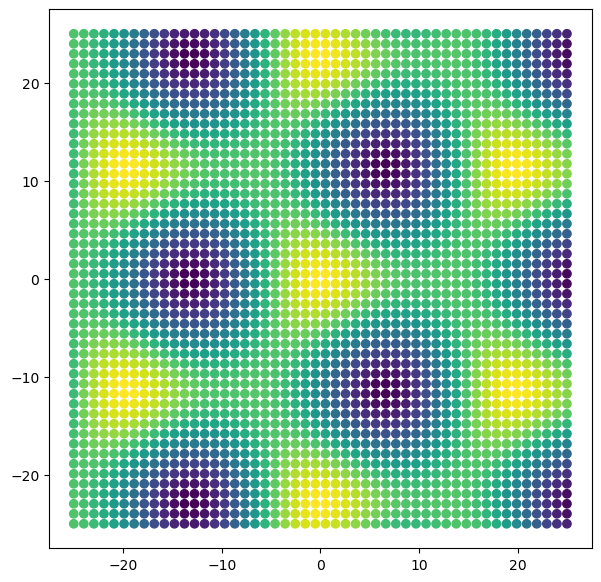

In [8]:
f = isom(0,0,2*pi/3)
pixels = get_pixels(50,50)
coloring = new_colors(pixels, f, p3)
x_points = []
y_points = []

for i in range(len(pixels)):
    x_points.append(pixels[i][0])
    y_points.append(pixels[i][1])
    
fig = plt.figure(figsize = (7, 7))
ax = plt.axes()
ax.scatter(x_points, y_points, c = coloring)
plt.show()

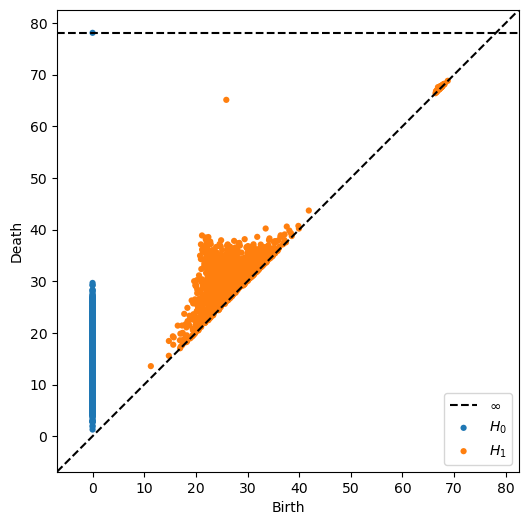

In [15]:
output = pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 30 , y_translate=30, maxdim=1, coeff=2)
plot_dgms(output)

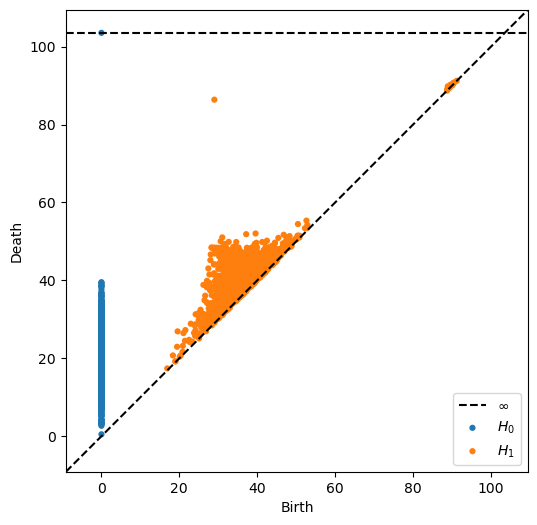

In [9]:
output = pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 30 , y_translate=30, maxdim=1, coeff=3)
plot_dgms(output)

In [10]:
persistent_H1_intervals(output)

[57.393585205078125,
 20.14878273010254,
 20.097618103027344,
 20.009992599487305,
 19.574859619140625,
 19.431903839111328,
 19.252365112304688,
 19.22994613647461,
 19.130380630493164,
 19.035629272460938,
 18.824453353881836,
 18.668500900268555,
 18.597076416015625,
 18.59504508972168,
 18.547107696533203,
 18.442045211791992,
 18.272809982299805,
 18.188562393188477,
 18.17914390563965,
 17.947378158569336,
 17.940763473510742,
 17.90616798400879,
 17.842418670654297,
 17.800594329833984,
 17.76749038696289,
 17.683866500854492,
 17.56415557861328,
 17.4783935546875,
 17.462812423706055,
 17.449596405029297,
 17.397397994995117,
 17.334922790527344,
 17.32638168334961,
 17.22789192199707,
 17.21097183227539,
 17.19729995727539,
 17.015478134155273,
 16.939348220825195,
 16.913227081298828,
 16.76568603515625,
 16.581684112548828,
 16.502578735351562,
 16.38397789001465,
 16.215618133544922,
 16.07879066467285,
 16.06463623046875,
 15.949773788452148,
 15.88111686706543,
 15.851949

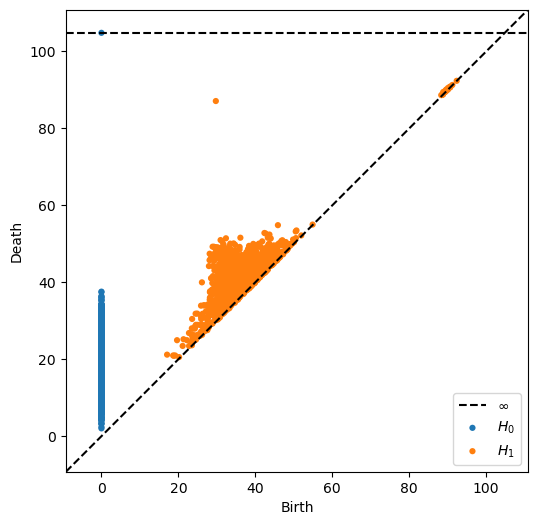

In [12]:
output = pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

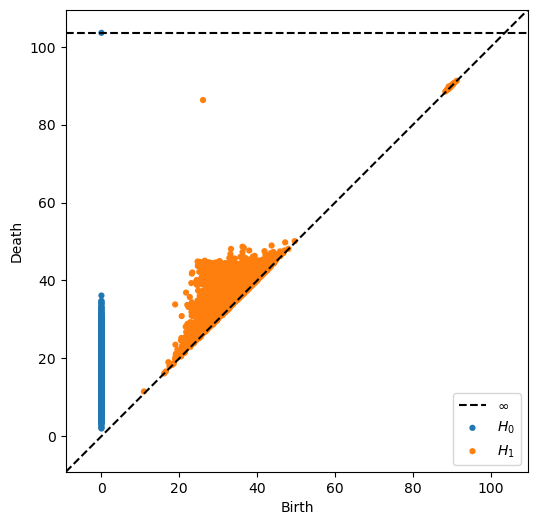

In [13]:
output = pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 3000, x_translate= 100 , y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

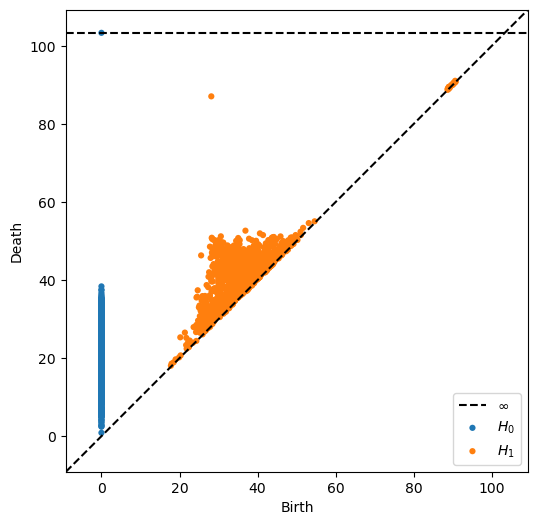

In [37]:
output = pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=5)
plot_dgms(output)

**Giving answers corresponding to C6?**

### Trying denoising

In [13]:
from math import dist

def denoise(M, radius):
    NewM = np.zeros((M.shape[0], M.shape[1]))
    for i in range(len(M)):
        neighbors = []
        for j in range(len(M)):
            if dist(M[i],M[j]) < radius:
                neighbors.append(M[j])
        NewM[i] = sum(neighbors)/len(neighbors)
    return NewM

def matrix_pipeline(image_function, num_pixels, window_size, n_isos, x_translate, y_translate):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    return M

In [10]:
M = matrix_pipeline(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 30 , y_translate=30)
M

array([[-2.04051057, -2.02528683, -1.75633309, ...,  1.28921971,
         2.08278277,  2.62005319],
       [ 0.84640536,  0.11677622, -0.6367946 , ...,  1.66937276,
         2.11754254,  2.38023022],
       [ 1.27214785,  0.58134748, -0.04383195, ..., -3.60397299,
        -3.26679266, -2.62151118],
       ...,
       [-1.49620894, -0.68721285,  0.08087372, ..., -0.20145747,
        -0.95374379, -1.7681099 ],
       [-1.72896826, -1.94358796, -1.8644883 , ...,  1.46107871,
         1.74325821,  2.01656951],
       [ 1.60069099,  2.18378383,  2.61505035, ..., -0.64999621,
        -1.50390447, -2.17721771]])

In [20]:
NewM = denoise(M, 70)
NewM

array([[-1.09855352, -1.12855446, -1.02629813, ...,  0.18293838,
         0.46758951,  0.63604937],
       [ 0.66738418,  0.23569106, -0.23158707, ...,  0.27483379,
         0.49259719,  0.65072652],
       [ 0.06231664, -0.16303763, -0.31458999, ..., -2.03458161,
        -1.78948676, -1.39471286],
       ...,
       [-0.28996985,  0.19924319,  0.62078748, ..., -0.30244831,
        -0.84773828, -1.35928805],
       [-1.22084881, -1.19985416, -1.0560704 , ...,  1.29042113,
         1.25958187,  1.173546  ],
       [ 0.83996291,  1.11201317,  1.29454894, ..., -0.82942425,
        -1.29282096, -1.63909135]])

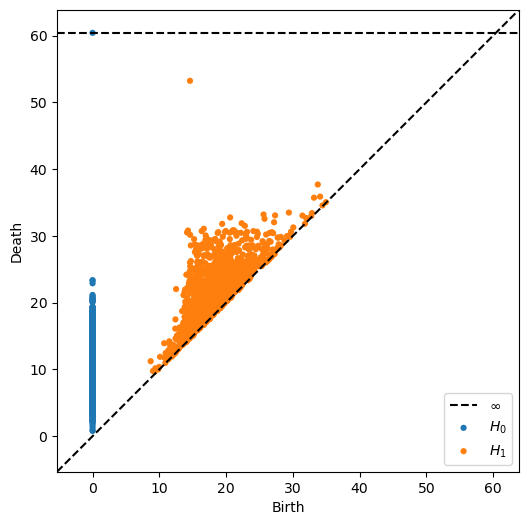

In [21]:
output = p_hom(NewM, maxdim=1, coeff=2)
plot_dgms(output)

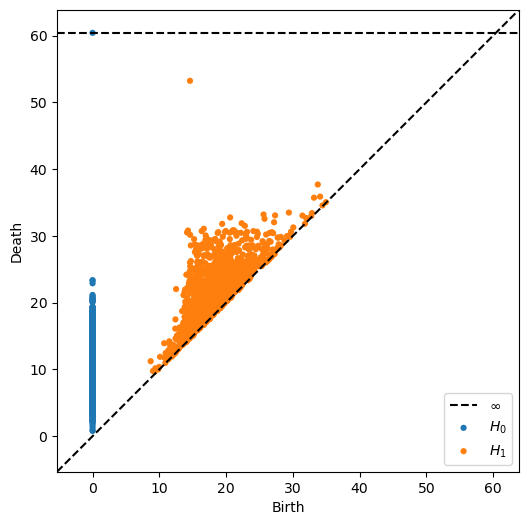

In [22]:
output = p_hom(NewM, maxdim=1, coeff=3)
plot_dgms(output)

still getting answers corresponding to C6

### Looking just at translations

In [7]:
def generate_isom_trans(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(np.zeros(2*n_isos)) 

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv


def pipeline_trans(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom_trans(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output


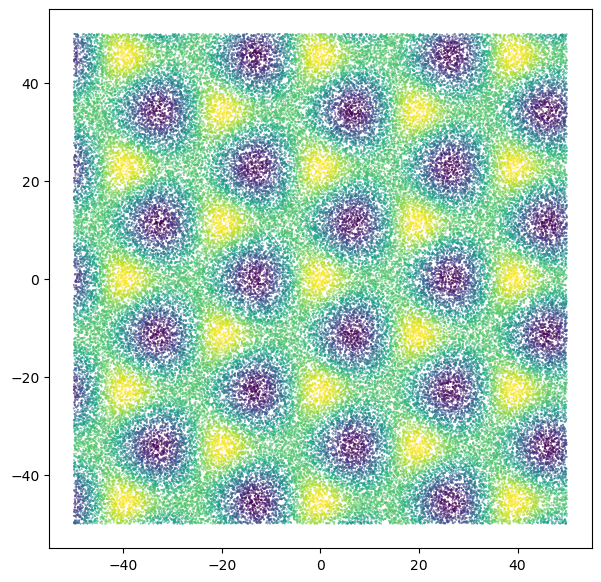

In [15]:
graph_continuous(p3, 50,50)

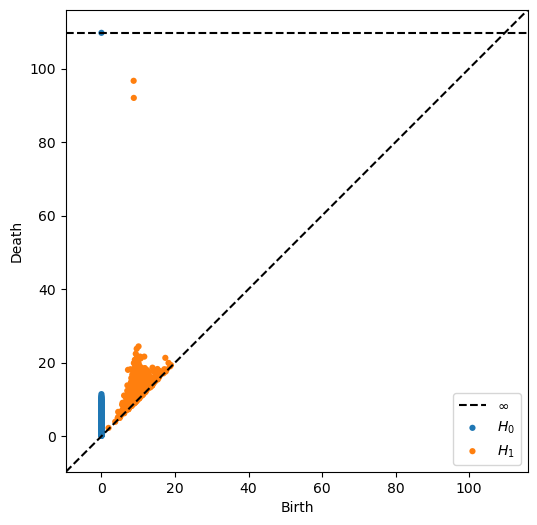

In [8]:
output = pipeline_trans(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

In [14]:
persistent_H1_intervals(output)

[87.89815616607666,
 83.2020673751831,
 14.3219575881958,
 14.191508293151855,
 13.073102951049805,
 12.069852828979492,
 11.699872970581055,
 11.125438690185547,
 11.059456825256348,
 11.048698425292969,
 10.832466125488281,
 10.825613975524902,
 10.61287784576416,
 10.569774627685547,
 10.47718620300293,
 10.398626327514648,
 10.373749732971191,
 10.287377834320068,
 10.211493492126465,
 10.13156509399414,
 10.031171798706055,
 9.989269256591797,
 9.823127746582031,
 9.587263107299805,
 9.458444595336914,
 9.454504013061523,
 9.26581859588623,
 9.235031127929688,
 9.229219436645508,
 9.15916633605957,
 8.971820831298828,
 8.829334259033203,
 8.554677963256836,
 8.529587745666504,
 8.489202499389648,
 8.357564926147461,
 8.248099327087402,
 8.199400901794434,
 8.142022132873535,
 8.086311340332031,
 7.796135902404785,
 7.774450302124023,
 7.674343109130859,
 7.664794921875,
 7.621976852416992,
 7.422311782836914,
 7.395995140075684,
 7.386831283569336,
 7.246170997619629,
 6.981723785

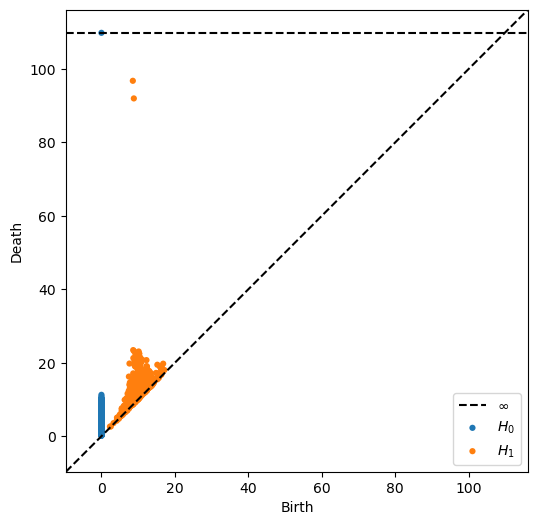

In [16]:
output = pipeline_trans(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

In [17]:
persistent_H1_intervals(output)

[88.22429943084717,
 83.15103244781494,
 14.792548179626465,
 14.269575119018555,
 13.042398452758789,
 12.921401023864746,
 12.586454391479492,
 12.263184547424316,
 12.2003812789917,
 12.147216320037842,
 12.12466049194336,
 11.79261589050293,
 11.567277908325195,
 11.436409950256348,
 10.923537254333496,
 10.921063423156738,
 10.81775951385498,
 10.808094024658203,
 10.712275505065918,
 10.650983810424805,
 9.92331600189209,
 9.918237686157227,
 9.838497161865234,
 9.615598678588867,
 9.458758354187012,
 9.24685287475586,
 8.95534610748291,
 8.752629280090332,
 8.714459419250488,
 8.454144477844238,
 8.449204444885254,
 8.438516616821289,
 8.174208641052246,
 8.139914512634277,
 7.99913215637207,
 7.832925796508789,
 7.792965888977051,
 7.717670440673828,
 7.55074405670166,
 7.512639045715332,
 7.3970537185668945,
 7.222805976867676,
 7.142607688903809,
 7.138707160949707,
 7.124276161193848,
 7.085421562194824,
 7.084316253662109,
 7.010904312133789,
 7.004031181335449,
 6.89818000

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


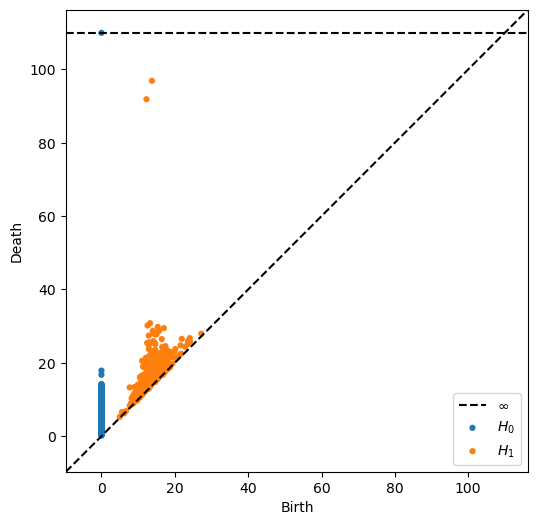

In [18]:
output = pipeline_trans(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 1000, x_translate= 100 , y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

In [19]:
persistent_H1_intervals(output)

[83.1345682144165,
 79.58434009552002,
 17.6185302734375,
 17.551995277404785,
 14.709726333618164,
 14.53703784942627,
 14.437533378601074,
 13.989378929138184,
 13.989142417907715,
 13.027792930603027,
 13.006101608276367,
 12.944534301757812,
 12.756792068481445,
 12.591886520385742,
 12.45228385925293,
 12.018623352050781,
 11.980064392089844,
 11.76625919342041,
 10.838419914245605,
 10.765029907226562,
 10.405710220336914,
 10.006763458251953,
 9.846916198730469,
 9.455280303955078,
 9.269094467163086,
 9.243078231811523,
 8.896238327026367,
 8.780914306640625,
 8.525843620300293,
 8.4555082321167,
 8.404486656188965,
 8.317234992980957,
 8.26961898803711,
 7.853109359741211,
 7.835172653198242,
 7.751401901245117,
 7.74942684173584,
 7.614890098571777,
 7.576007843017578,
 7.499505996704102,
 7.191251754760742,
 7.143975257873535,
 7.0922346115112305,
 7.0614776611328125,
 7.049921035766602,
 7.001699447631836,
 6.9415483474731445,
 6.938450813293457,
 6.91596794128418,
 6.83018

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


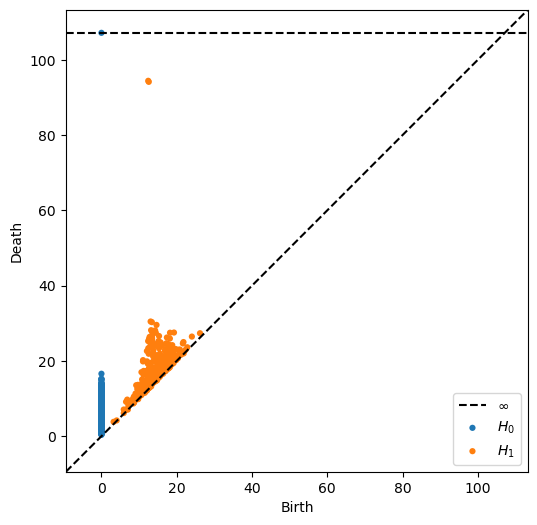

In [24]:
output = pipeline_trans(image_function = p3, num_pixels = 40 , window_size = 20, n_isos = 1000, x_translate= 100 , y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

In [26]:
 persistent_H1_intervals(output)

[81.97568035125732,
 81.55618000030518,
 17.404528617858887,
 16.90952491760254,
 14.961994171142578,
 14.934322357177734,
 14.348639488220215,
 13.854490280151367,
 13.57569694519043,
 13.33395004272461,
 13.211503028869629,
 13.041576385498047,
 12.852449417114258,
 12.573281288146973,
 12.022441864013672,
 11.465441703796387,
 11.313176155090332,
 10.99683666229248,
 10.924020767211914,
 10.549979209899902,
 10.54520320892334,
 10.105483055114746,
 9.991151809692383,
 9.784195899963379,
 9.33643627166748,
 9.30540943145752,
 9.264406204223633,
 9.153233528137207,
 9.149704933166504,
 8.99673843383789,
 8.830806732177734,
 8.82180118560791,
 8.44466495513916,
 8.267097473144531,
 8.173430442810059,
 8.107000350952148,
 8.046224594116211,
 7.767274856567383,
 7.757550239562988,
 7.458008766174316,
 7.431880950927734,
 7.333782196044922,
 7.028835296630859,
 6.947153091430664,
 6.641833305358887,
 6.603899002075195,
 6.600620269775391,
 6.41986083984375,
 6.3686370849609375,
 6.3352613

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


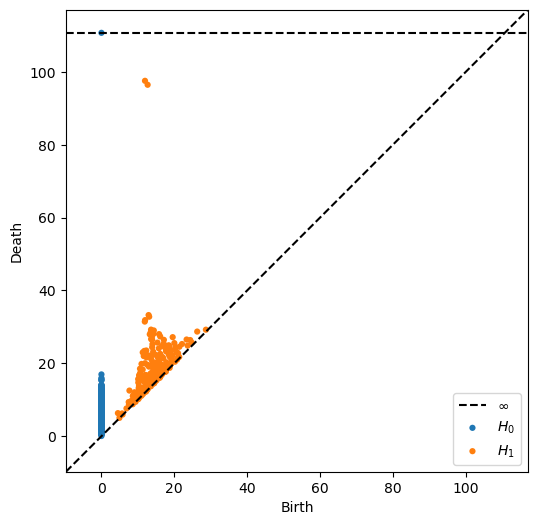

In [22]:
output = pipeline_trans(image_function = p3, num_pixels = 40 , window_size = 100, n_isos = 1000, x_translate= 1000 , y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

In [23]:
persistent_H1_intervals(output)

[85.60655403137207,
 83.7932825088501,
 20.307353973388672,
 19.873605728149414,
 19.6854887008667,
 19.56228256225586,
 15.640190124511719,
 15.022626876831055,
 14.697853088378906,
 14.640625,
 14.021811485290527,
 13.903700828552246,
 13.842093467712402,
 13.488920211791992,
 13.018607139587402,
 12.574617385864258,
 12.19698715209961,
 11.667590141296387,
 11.641480445861816,
 11.265369415283203,
 11.244093894958496,
 11.210805892944336,
 10.491642951965332,
 10.387481689453125,
 10.324928283691406,
 10.044751167297363,
 9.784750938415527,
 9.403430938720703,
 9.309885025024414,
 9.238798141479492,
 8.988463401794434,
 8.837729454040527,
 8.467574119567871,
 8.353047370910645,
 8.28929328918457,
 8.166784286499023,
 8.07184886932373,
 7.929143905639648,
 7.628643035888672,
 7.557188987731934,
 7.2879838943481445,
 7.026508331298828,
 6.960943222045898,
 6.957537651062012,
 6.704291343688965,
 6.545738220214844,
 6.483640670776367,
 6.454944610595703,
 6.409722328186035,
 6.39242362

### Lens output for 180 rotation

In [136]:
def generate_0_isom(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(0 * np.ones(n_isos)) 

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

def generate_90_isom(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(pi/2 * np.ones(n_isos)) 

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

def generate_180_isom(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(pi * np.ones(n_isos)) 

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

def view_isom(vector, num_pixels, window_size):
    
    pixels = get_pixels(num_pixels, window_size)
    
    #vector.reshape(window_size, window_size)
    
    #x_points = window_size * list(np.linspace(-10, 10, window_size))
    #y_points = window_size * list(np.linspace(-10, 10, window_size))
    #y_points.sort()
    
    x_points = []
    y_points = []
    for i in range(len(pixels)):
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (3, 3))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = vector)
    plt.show()
    
def matrix(pixels, isos_inv, image_function):
    vectors = []
    for i in isos_inv:
        vectors.append([new_colors(pixels, i, image_function)])
    M = np.concatenate(vectors, axis=0 )
    return M

In [112]:
def view_window_continuous_small(image_function, num_pixels, window_size):
    
    pixels = get_pixels(num_pixels, window_size)
            
    x_points = []
    y_points = []
    colors = []
    for i in range(len(pixels)):
        color = image_function(pixels[i][0],pixels[i][1]) 
        colors.append(color)
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (3, 3))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors)
    plt.show()

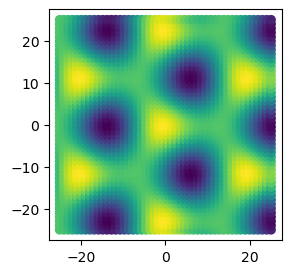

In [113]:
view_window_continuous_small(image_function = p3, num_pixels=50, window_size=50)

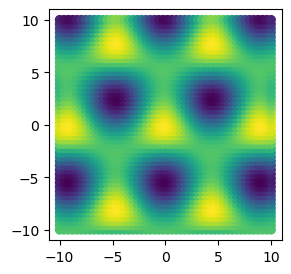

In [114]:
def new_colors(pixels, iso_inv, image_function):
    pixels_inv = []
    for pixel in pixels: 
        pixels_inv.append(iso_inv(pixel[0], pixel[1]))
    new_colors = get_colors(pixels_inv, image_function)
    return new_colors

f = isom(0,0,0)
pixels = get_pixels(num_pixels=50, window_size = 50)
vector = np.asarray(new_colors(pixels, f, p3))
view_isom(vector,num_pixels=50, window_size=50)

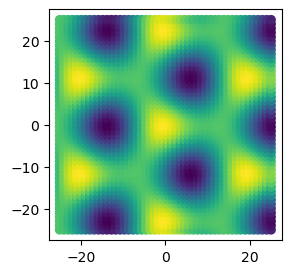

In [137]:
view_isom(vector,num_pixels=50, window_size=50)

In [ ]:
# The way i was printing the isometries automatically rotated the image by 90 degrees

In [130]:
pixels_inv = []
for pixel in pixels: 
    pixels_inv.append(f(pixel[0], pixel[1]))
pixels_inv

[(-25.0, -25.0),
 (-25.0, -23.979591836734695),
 (-25.0, -22.959183673469386),
 (-25.0, -21.93877551020408),
 (-25.0, -20.918367346938776),
 (-25.0, -19.89795918367347),
 (-25.0, -18.877551020408163),
 (-25.0, -17.857142857142858),
 (-25.0, -16.836734693877553),
 (-25.0, -15.816326530612244),
 (-25.0, -14.795918367346939),
 (-25.0, -13.775510204081632),
 (-25.0, -12.755102040816325),
 (-25.0, -11.73469387755102),
 (-25.0, -10.714285714285714),
 (-25.0, -9.693877551020408),
 (-25.0, -8.673469387755102),
 (-25.0, -7.653061224489797),
 (-25.0, -6.632653061224488),
 (-25.0, -5.612244897959183),
 (-25.0, -4.591836734693878),
 (-25.0, -3.5714285714285694),
 (-25.0, -2.5510204081632644),
 (-25.0, -1.5306122448979593),
 (-25.0, -0.5102040816326507),
 (-25.0, 0.5102040816326543),
 (-25.0, 1.5306122448979593),
 (-25.0, 2.5510204081632644),
 (-25.0, 3.571428571428573),
 (-25.0, 4.591836734693878),
 (-25.0, 5.612244897959183),
 (-25.0, 6.632653061224492),
 (-25.0, 7.653061224489797),
 (-25.0, 8.67

In [135]:
get_colors(pixels_inv, p3)

[1.0114005103817234,
 1.0299435833585253,
 1.0375684382607413,
 1.033675732058221,
 1.0185714464858069,
 0.9934428366977652,
 0.96026510842941,
 0.921646159201257,
 0.8806215875064409,
 0.8404160830505907,
 0.8041899536924494,
 0.7747907130461708,
 0.7545292549187868,
 0.7449982081360252,
 0.7469467497684675,
 0.7602217169216923,
 0.7837796459310511,
 0.8157687926338522,
 0.8536746866090139,
 0.8945177782589477,
 0.93508764291013,
 0.9721953325859056,
 1.0029240396279875,
 1.0248583690383977,
 1.0362741978506398,
 1.0362741978506393,
 1.0248583690383963,
 1.0029240396279873,
 0.9721953325859052,
 0.9350876429101306,
 0.8945177782589459,
 0.8536746866090139,
 0.8157687926338522,
 0.7837796459310493,
 0.7602217169216918,
 0.7469467497684645,
 0.7449982081360246,
 0.7545292549187868,
 0.7747907130461745,
 0.8041899536924487,
 0.8404160830505929,
 0.8806215875064398,
 0.9216461592012568,
 0.96026510842941,
 0.9934428366977666,
 1.0185714464858069,
 1.033675732058221,
 1.0375684382607409,
 

In [134]:
x_points = []
y_points = []
colors = []
for i in range(len(pixels)):
    color = p3(pixels[i][0],pixels[i][1]) 
    colors.append(color)
    x_points.append(pixels[i][0])
    y_points.append(pixels[i][1])
colors

[1.0114005103817234,
 1.0299435833585253,
 1.0375684382607413,
 1.033675732058221,
 1.0185714464858069,
 0.9934428366977652,
 0.96026510842941,
 0.921646159201257,
 0.8806215875064409,
 0.8404160830505907,
 0.8041899536924494,
 0.7747907130461708,
 0.7545292549187868,
 0.7449982081360252,
 0.7469467497684675,
 0.7602217169216923,
 0.7837796459310511,
 0.8157687926338522,
 0.8536746866090139,
 0.8945177782589477,
 0.93508764291013,
 0.9721953325859056,
 1.0029240396279875,
 1.0248583690383977,
 1.0362741978506398,
 1.0362741978506393,
 1.0248583690383963,
 1.0029240396279873,
 0.9721953325859052,
 0.9350876429101306,
 0.8945177782589459,
 0.8536746866090139,
 0.8157687926338522,
 0.7837796459310493,
 0.7602217169216918,
 0.7469467497684645,
 0.7449982081360246,
 0.7545292549187868,
 0.7747907130461745,
 0.8041899536924487,
 0.8404160830505929,
 0.8806215875064398,
 0.9216461592012568,
 0.96026510842941,
 0.9934428366977666,
 1.0185714464858069,
 1.033675732058221,
 1.0375684382607409,
 

In [120]:
vector = np.asarray(new_colors(pixels, iso_inv = f, image_function = p3))
vector

array([ 1.01140051,  1.02994358,  1.03756844, ..., -3.91985389,
       -3.77302261, -3.41594   ])

In [121]:
vector2 = np.asarray(new_colors(pixels, iso_inv = p3, image_function = p3))
vector2

IndexError: invalid index to scalar variable.

In [126]:
f(1,1)

(1.0, 1.0)

In [127]:
p3(1,1)

2.8419710135390632

In [100]:
F = generate_180_isom(10, 100, 100)
G = generate_90_isom(10, 100, 100)
Z = generate_0_isom(10, 100, 100)

In [101]:
pixels = get_pixels(num_pixels=50, window_size = 50)

In [102]:
M = matrix(pixels, F, p3)
N = matrix(pixels, G, p3)
O = matrix(pixels, Z, p3)

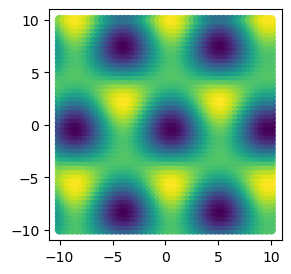

In [103]:
view_isom(M[0],num_pixels=50, window_size=50)

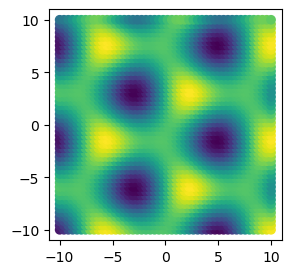

In [104]:
view_isom(N[0], num_pixels=50, window_size=50)

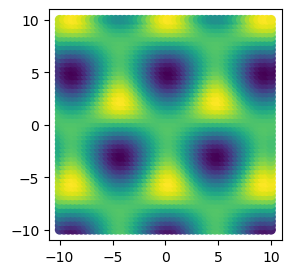

In [105]:
view_isom(O[0], num_pixels=50, window_size=50)

In [31]:
def generate_isom_trans(n_isos, x_translate, y_translate, n_translates):
    a = list(2 * x_translate * np.random.random(n_isos+ n_translates) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos+n_translates) - y_translate) # sampling from (-y,y)
    theta = [0] * n_translates
    theta2 = list(2 * pi * np.random.random(n_isos)) # sampling from (0, 2pi)
    for i in theta2:
        theta.append(i)

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

In [ ]:
M = view_matrix(image_function = p3, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, n_translate = 500)
M

In [11]:
M2 = M*2
M2

array([[ 0.75296051,  0.62674978,  0.77299925, ...,  2.8818037 ,
         3.78079014,  4.00910229],
       [ 2.26896014,  2.26570663,  1.67325227, ..., -7.51434807,
        -8.11160287, -8.04306958],
       [ 0.66009802, -0.34064256, -1.06896671, ...,  1.2794918 ,
         1.40085485,  1.74973233],
       ...,
       [-5.92143899, -4.56808384, -2.77462756, ...,  4.68030975,
         3.61294897,  2.40471931],
       [-7.4163298 , -6.90756566, -5.75487874, ...,  4.81799057,
         3.9297314 ,  3.03506651],
       [ 3.97493792,  2.82733495,  1.63085076, ...,  5.6647284 ,
         5.38891757,  4.8168194 ]])

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


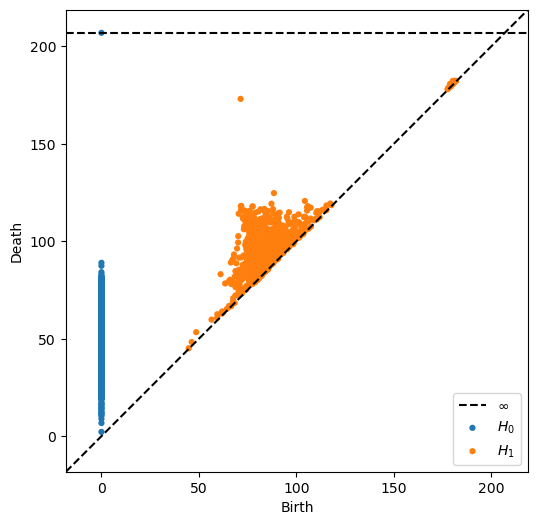

In [18]:
output = p_hom(M2, maxdim = 1, coeff=3 )
plot_dgms(output)

In [15]:
M3 = M*3
M3

array([[  1.12944076,   0.94012468,   1.15949887, ...,   4.32270555,
          5.67118521,   6.01365344],
       [  3.40344021,   3.39855995,   2.5098784 , ..., -11.27152211,
        -12.1674043 , -12.06460438],
       [  0.99014703,  -0.51096384,  -1.60345007, ...,   1.91923769,
          2.10128228,   2.62459849],
       ...,
       [ -8.88215849,  -6.85212576,  -4.16194134, ...,   7.02046463,
          5.41942345,   3.60707897],
       [-11.12449469, -10.3613485 ,  -8.63231811, ...,   7.22698585,
          5.8945971 ,   4.55259976],
       [  5.96240689,   4.24100242,   2.44627614, ...,   8.49709261,
          8.08337635,   7.22522911]])

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


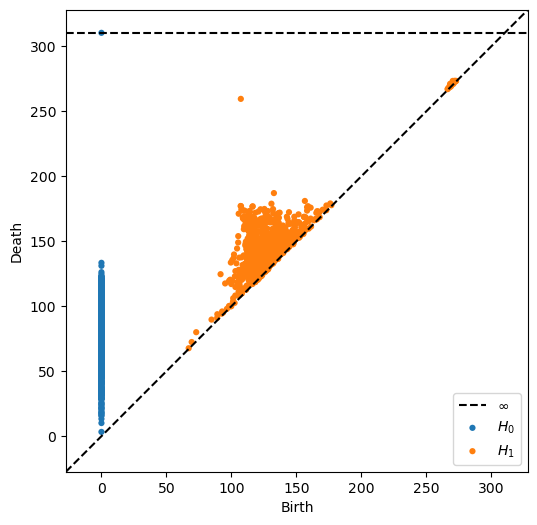

In [19]:
output = p_hom(M3, maxdim = 1, coeff=2 )
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


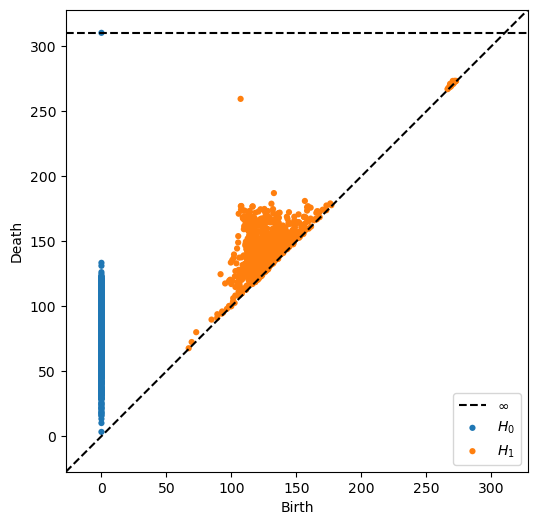

In [17]:
output = p_hom(M3, maxdim = 1, coeff=3 )
plot_dgms(output)

In [23]:
Mhalf = M*0.5
Mhalf

array([[ 0.18824013,  0.15668745,  0.19324981, ...,  0.72045092,
         0.94519753,  1.00227557],
       [ 0.56724003,  0.56642666,  0.41831307, ..., -1.87858702,
        -2.02790072, -2.0107674 ],
       [ 0.1650245 , -0.08516064, -0.26724168, ...,  0.31987295,
         0.35021371,  0.43743308],
       ...,
       [-1.48035975, -1.14202096, -0.69365689, ...,  1.17007744,
         0.90323724,  0.60117983],
       [-1.85408245, -1.72689142, -1.43871968, ...,  1.20449764,
         0.98243285,  0.75876663],
       [ 0.99373448,  0.70683374,  0.40771269, ...,  1.4161821 ,
         1.34722939,  1.20420485]])

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


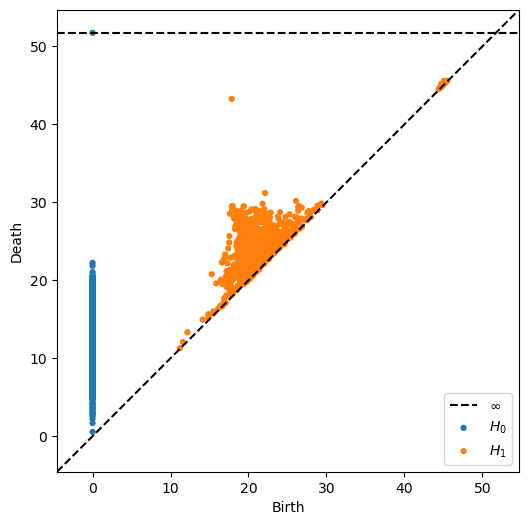

In [24]:
output = p_hom(Mhalf, maxdim = 1, coeff=3 )
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


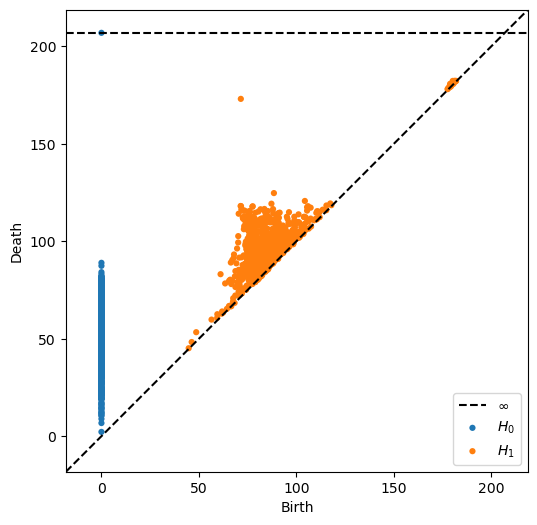

In [25]:
output = p_hom(M2, maxdim = 1, coeff=2 )
plot_dgms(output)

# C6

In [15]:
def p6(x,y):
    X = 1/(2 * pi) * (x + y / (3**(1/2)))
    Y = 1/(2 * pi) * 2 * y / (3**(1/2))
    C = cos(X + Y) + cos(X - 2 * Y) + cos(-2 * X + Y)
    S = sin(X + Y) +sin(X - 2*Y) +sin(-2 * X + Y)
    return C 

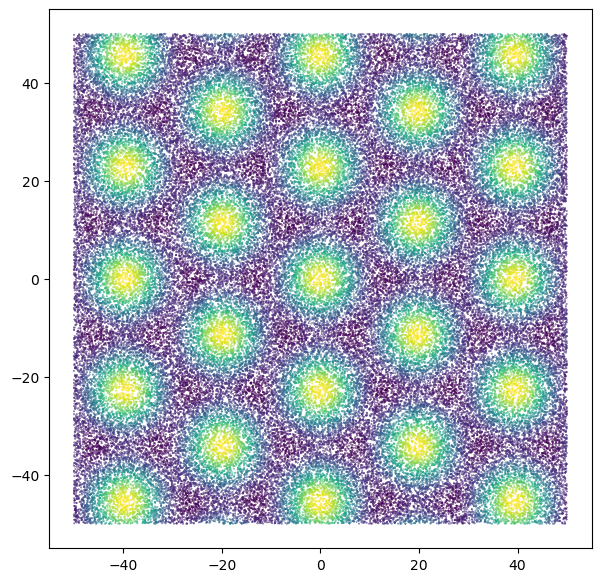

In [16]:
graph_continuous(p6, 50,50)

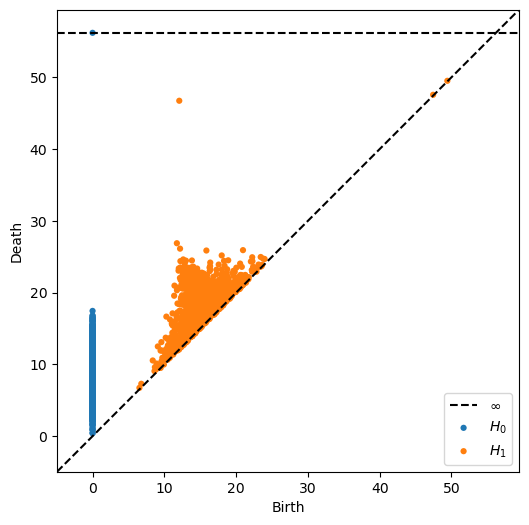

In [20]:
output = pipeline(image_function = p6, num_pixels = 30 , window_size = 50, n_isos = 2000, x_translate= 10 , y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

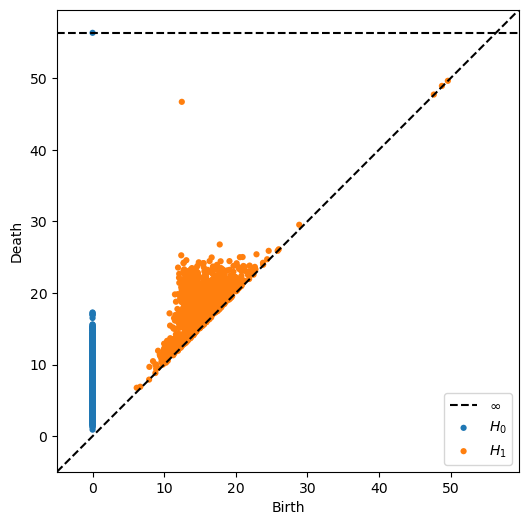

In [21]:
output = pipeline(image_function = p6, num_pixels = 30 , window_size = 50, n_isos = 2000, x_translate= 30 , y_translate=30, maxdim=1, coeff=3)
plot_dgms(output)

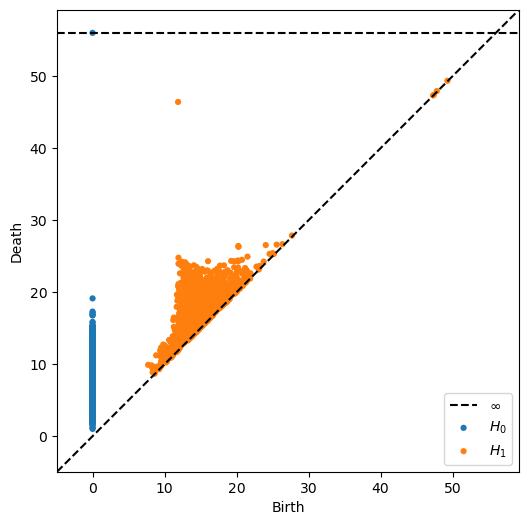

In [22]:
output = pipeline(image_function = p6, num_pixels = 30 , window_size = 50, n_isos = 2000, x_translate= 10 , y_translate=10, maxdim=1, coeff=5)
plot_dgms(output)

### Looking at only translations again

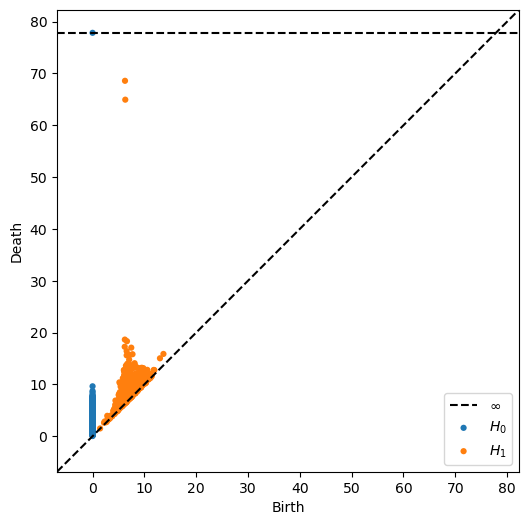

In [17]:
output = pipeline_trans(image_function = p6, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

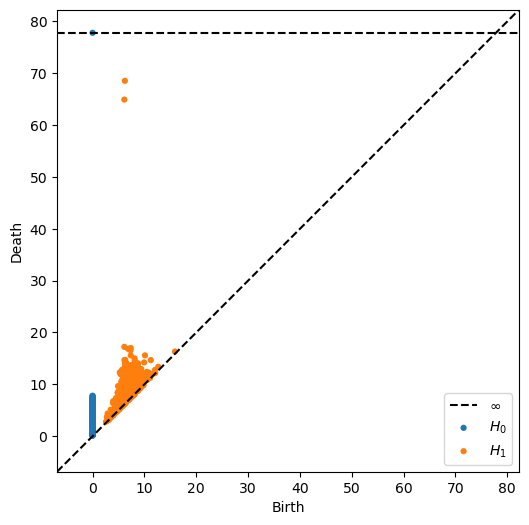

In [18]:
output = pipeline_trans(image_function = p6, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

**at least the C6 also looks like C6**

In [4]:
def p3_sin(x,y):
    X = 1/(2 * pi) * (x + y / (3**(1/2)))
    Y = 1/(2 * pi) * 2 * y / (3**(1/2))
    C = cos(X + Y) + cos(X - 2 * Y) + cos(-2 * X + Y)
    S = sin(X + Y) +sin(X - 2*Y) +sin(-2 * X + Y)
    return S

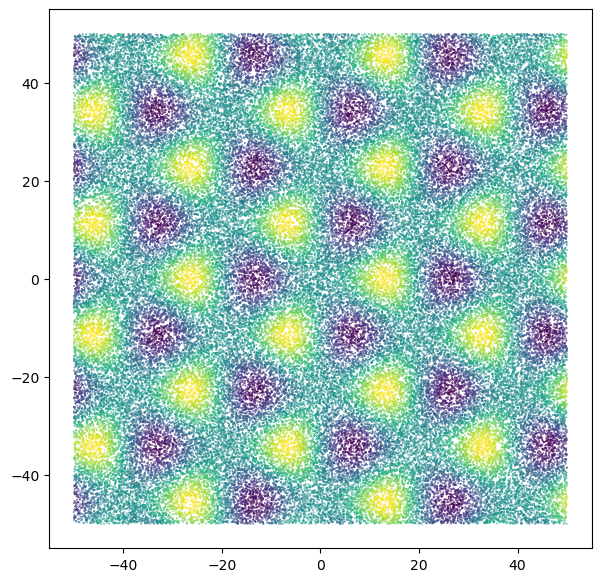

In [5]:
graph_continuous(p3_sin, 50,50)

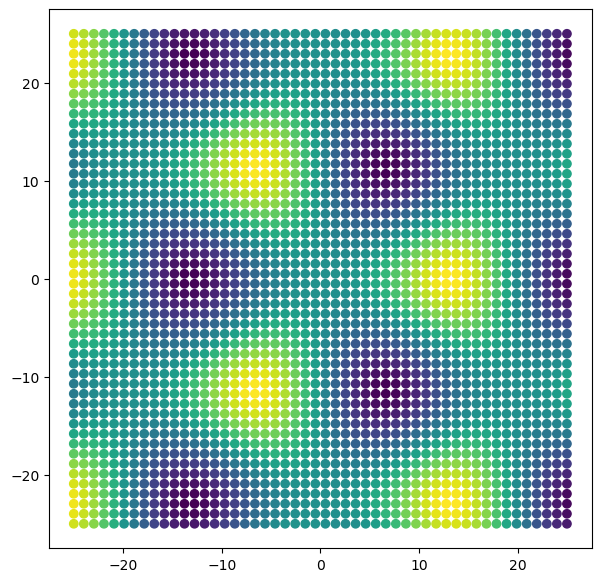

In [6]:
view_window_continuous(p3_sin, 50, 50)

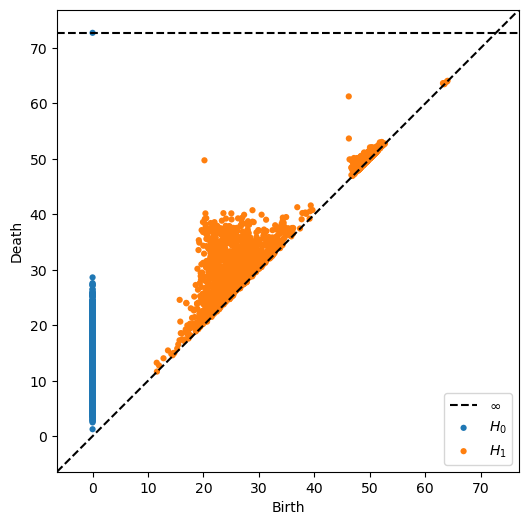

In [7]:
output = pipeline(image_function = p3_sin, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 200 , y_translate=200, maxdim=1, coeff=2)
plot_dgms(output)

In [8]:
persistent_H1_intervals(output)

[29.569517135620117,
 19.82049560546875,
 18.92938232421875,
 18.79657554626465,
 18.70867156982422,
 17.851652145385742,
 17.775150299072266,
 17.49486541748047,
 17.25086784362793,
 17.131120681762695,
 16.885353088378906,
 16.64559555053711,
 16.62132453918457,
 16.609270095825195,
 16.408905029296875,
 16.30372428894043,
 16.18557357788086,
 16.174013137817383,
 16.144351959228516,
 16.10912322998047,
 16.02729034423828,
 15.989049911499023,
 15.980751037597656,
 15.95248794555664,
 15.66080093383789,
 15.593883514404297,
 15.5589599609375,
 15.540229797363281,
 15.51002311706543,
 15.461944580078125,
 15.403762817382812,
 15.201684951782227,
 15.181774139404297,
 15.153064727783203,
 15.070880889892578,
 15.054996490478516,
 15.030632019042969,
 15.003999710083008,
 14.919591903686523,
 14.803133010864258,
 14.658147811889648,
 14.6219482421875,
 14.561626434326172,
 14.46706771850586,
 14.413475036621094,
 14.400396347045898,
 14.377708435058594,
 14.352087020874023,
 14.34927177

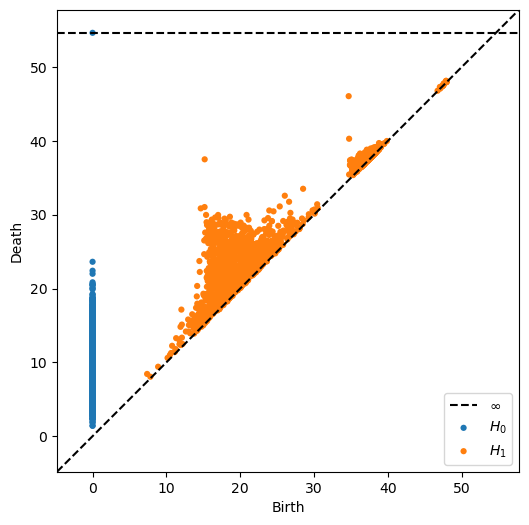

In [9]:
output = pipeline(image_function = p3_sin, num_pixels = 30 , window_size = 50, n_isos = 2000, x_translate= 200 , y_translate=200, maxdim=1, coeff=2)
plot_dgms(output)

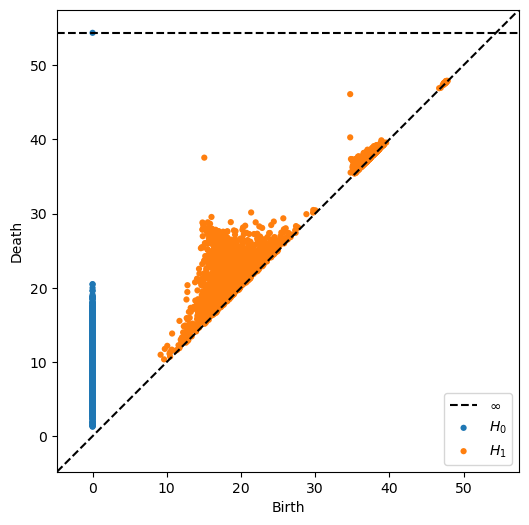

In [11]:
output = pipeline(image_function = p3_sin, num_pixels = 30 , window_size = 50, n_isos = 2200, x_translate= 200 , y_translate=200, maxdim=1, coeff=2)
plot_dgms(output)

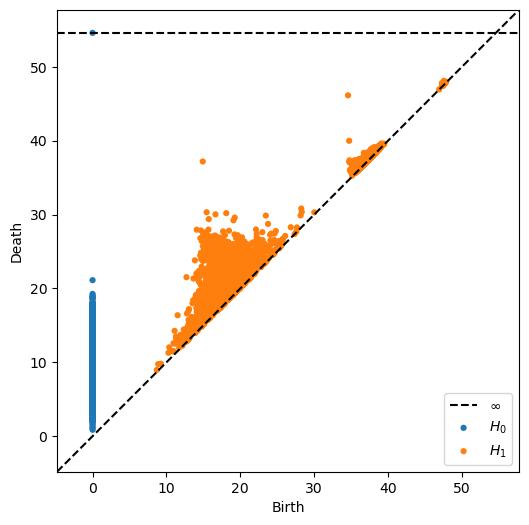

In [12]:
output = pipeline(image_function = p3_sin, num_pixels = 30 , window_size = 50, n_isos = 2400, x_translate= 200 , y_translate=200, maxdim=1, coeff=2)
plot_dgms(output)


In [13]:
persistent_H1_intervals(output)

[22.26878833770752,
 14.87667465209961,
 13.854657173156738,
 13.657491683959961,
 13.389724731445312,
 13.18149471282959,
 12.391648292541504,
 12.312947273254395,
 12.27723503112793,
 12.205665588378906,
 12.09219741821289,
 11.839478492736816,
 11.707765579223633,
 11.60214900970459,
 11.591055870056152,
 11.556297302246094,
 11.516739845275879,
 11.494369506835938,
 11.474510192871094,
 11.419692993164062,
 11.368881225585938,
 11.352112770080566,
 11.261360168457031,
 11.209455490112305,
 11.099246978759766,
 11.090221405029297,
 11.077605247497559,
 11.010418891906738,
 10.839305877685547,
 10.8318452835083,
 10.78781509399414,
 10.781829833984375,
 10.734585762023926,
 10.714823722839355,
 10.683349609375,
 10.669822692871094,
 10.667293548583984,
 10.647098541259766,
 10.616358757019043,
 10.613791465759277,
 10.597236633300781,
 10.585817337036133,
 10.582806587219238,
 10.556804656982422,
 10.491294860839844,
 10.464408874511719,
 10.430695533752441,
 10.372625350952148,
 10.

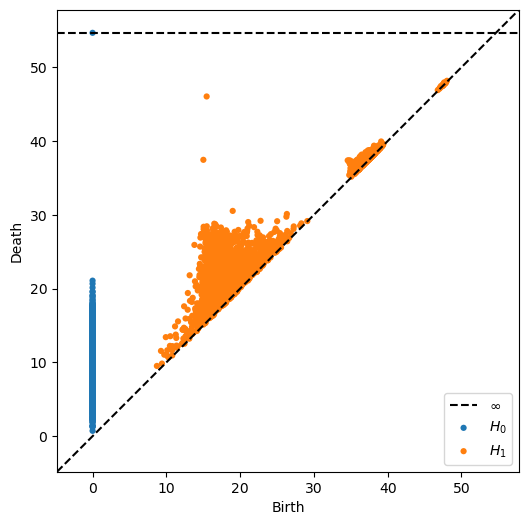

In [10]:
output = pipeline(image_function = p3_sin, num_pixels = 30 , window_size = 50, n_isos = 2200, x_translate= 200 , y_translate=200, maxdim=1, coeff=3)
plot_dgms(output)

**between 1 and 3 for $\mathbb{Z}_2$ and 2 for $\mathbb{Z_3}$**

# Kyle's example

In [6]:
def lw_by_hand(x,y):
    return cos(3*x + 2*y) + sin(2*x + y)

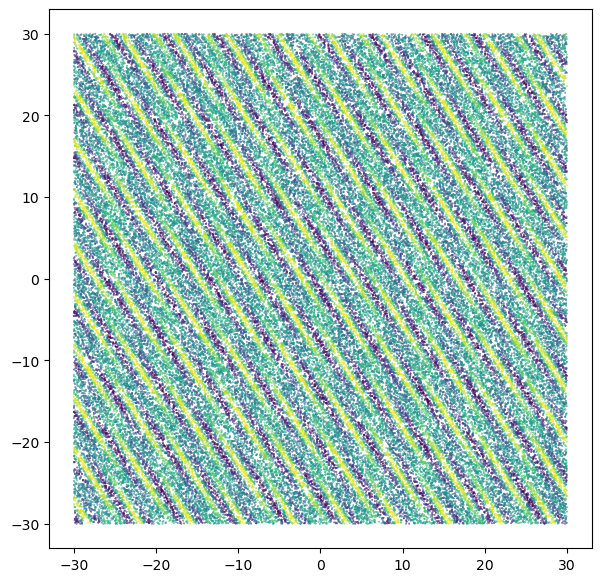

In [7]:
graph_continuous(lw_by_hand, 30,30)

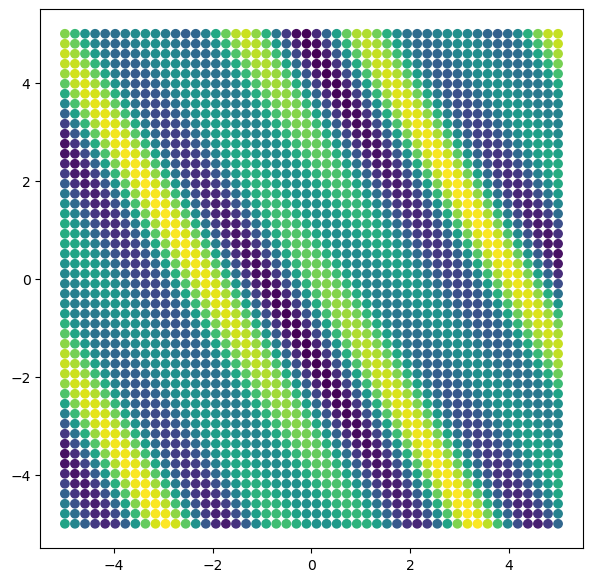

In [8]:
view_window_continuous(lw_by_hand, 50, 10)

In [9]:
def pipeline(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

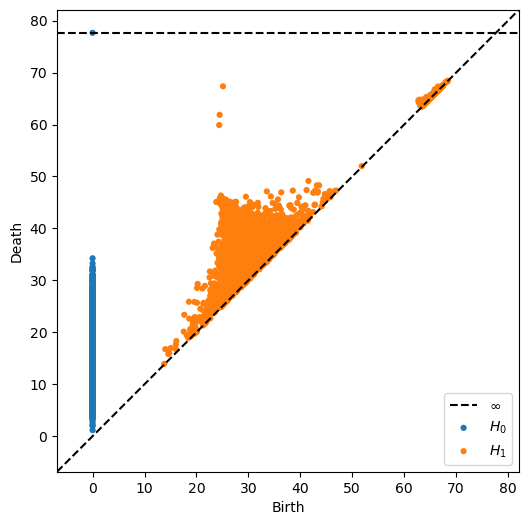

In [137]:
output = pipeline(image_function = lw_by_hand, num_pixels = 50 , window_size = 10, n_isos = 3000, x_translate= 10 , y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

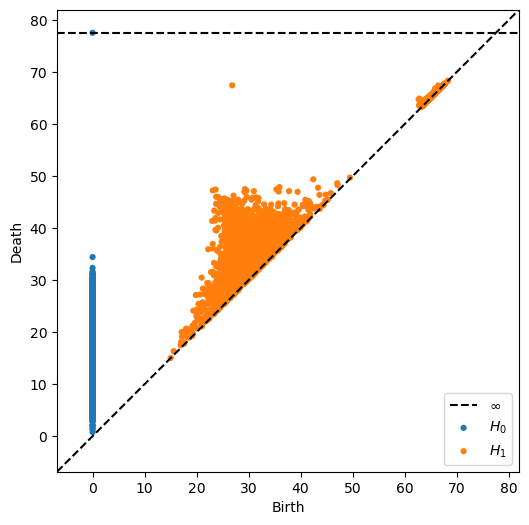

In [138]:
output = pipeline(image_function = lw_by_hand, num_pixels = 50 , window_size = 10, n_isos = 3000, x_translate= 10 , y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

homology of 3 in $Z_2$ and 1 in $Z_1$ corresponds to C_2

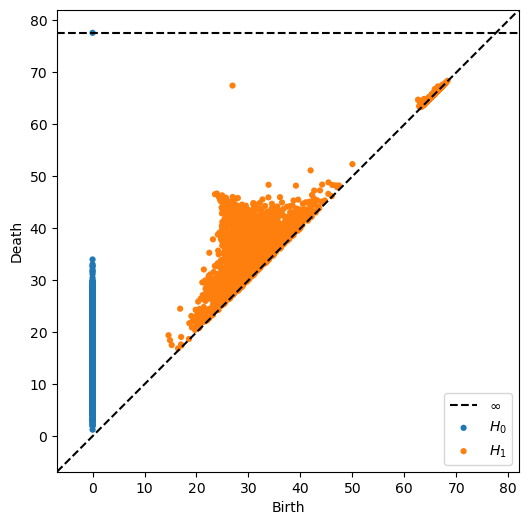

In [10]:
output = pipeline(image_function = lw_by_hand, num_pixels = 50 , window_size = 10, n_isos = 3000, x_translate= 10 , y_translate=10, maxdim=1, coeff=5)
plot_dgms(output)

In [29]:
def pdx(x,y):
    return cos(6*pi*x)*cos(2*pi*y) + cos(2*pi*y)*sin(6*pi*x) + cos(4*pi*x)*sin(pi*y)

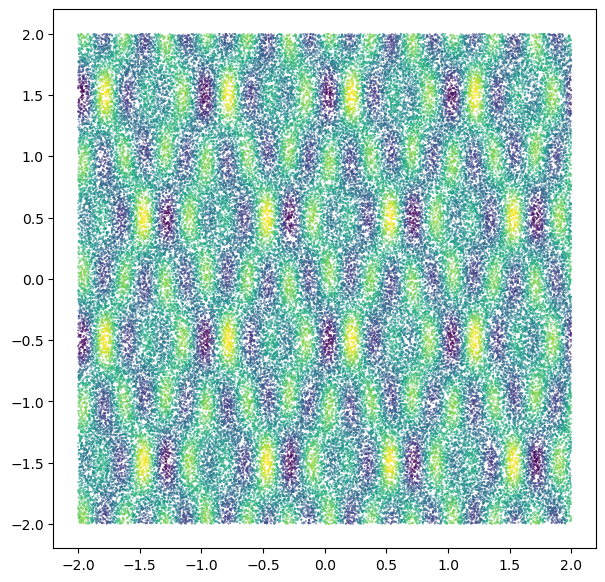

In [34]:
graph_continuous(pdx, 2,2)

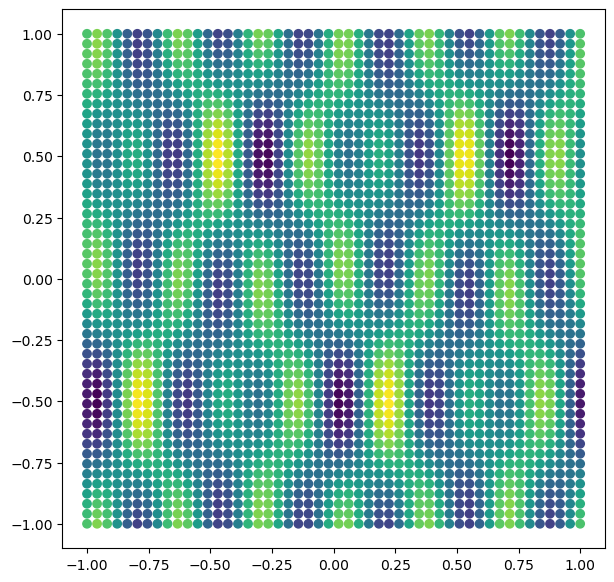

In [39]:
view_window_continuous(pdx, 50, 2)

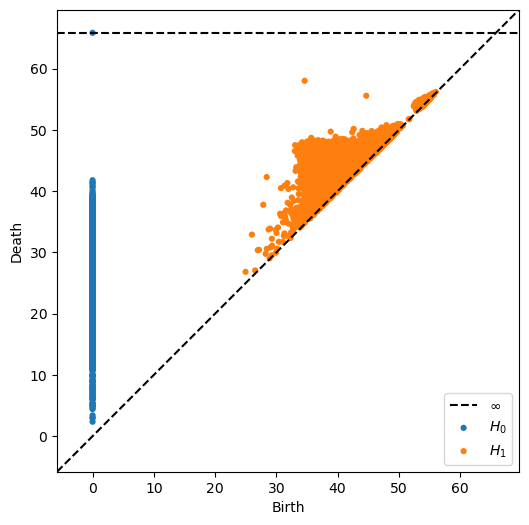

In [40]:
output = pipeline(image_function = pdx, num_pixels = 50 , window_size = 2, n_isos = 3000, x_translate= 10 , y_translate=10, maxdim=1, coeff=5)
plot_dgms(output)

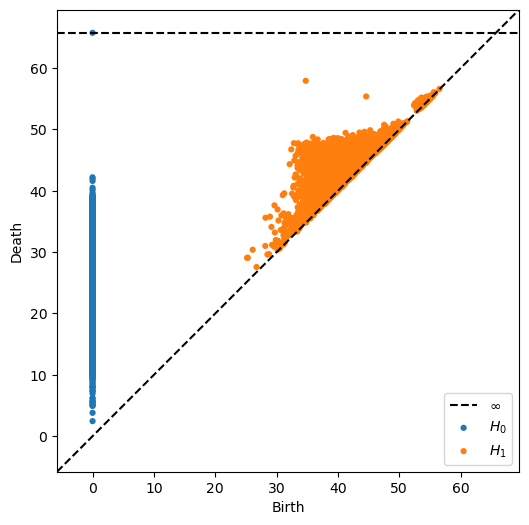

In [41]:
output = pipeline(image_function = pdx, num_pixels = 50 , window_size = 2, n_isos = 3000, x_translate= 10 , y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [ ]:
output = pipeline(image_function = pdx, num_pixels = 50 , window_size = 2, n_isos = 6000, x_translate= 10 , y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [ ]:
output = pipeline(image_function = pdx, num_pixels = 50 , window_size = 3, n_isos = 6000, x_translate= 20 , y_translate=20, maxdim=1, coeff=2)
plot_dgms(output)